# Install some essential packages

In [ ]:
!pip install nilearn
!pip install shap
!pip install xgboost==1.7.6 # specify the version number is recommended to ensure compatibility for model evaluation at a later stage.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 87.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.3/200.3 MB 7.1 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.0.3
    Uninstalling xgboost-2.0.3:
      Successfully uninstalled xgboost-2.0.3


# Import packages

In [ ]:
import os

import numpy as np
import pandas as pd
import os.path as op
from glob import glob
import re

import nibabel as nib
from nibabel.testing import data_path

import nilearn
from nilearn import plotting
from nilearn import image

from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.feature_selection import VarianceThreshold

import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from joblib import dump, load

from xgboost import plot_importance


import copy as cp
import seaborn as sns
from typing import Tuple
from sklearn.metrics import confusion_matrix
import scipy.stats
from collections import Counter

import matplotlib.pyplot as plt
plt.style.use('seaborn-bright')
#plt.figure(facecolor='white')

<ipython-input-2-994f92b50b9a>:37: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-bright')


# Global Settings

In [ ]:
set_env = 2   # 0 = Local macOS machine, 1 = Local linux machine with cuda support, 2 = Google Colab
hyper_tune = 4 # 1 = grid search in a small range based on previously earned best state of 100 paras; 2 = grid search in a small range based on previously earned best state of 150 paras; 3 = grid search in a small range based on the best state of 400 parcels; 4 = a exhaustive grid search;

# Data curation and cleaning

## Load the data and customised functions

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


#### replace the paths to where you save the input data

if set_env == 0:
   dat_spmt = pd.read_csv('/Volumes/LaCie/Backup/230518_study3_fMRI/data-brain-xgboost-dividedattn-wangetal/dat_all/dat_spmt.csv')
   dir_spmt = '/Volumes/LaCie/Backup/230518_study3_fMRI/data-brain-xgboost-dividedattn-wangetal/dat_all/'
elif set_env == 1:
   dat_spmt = pd.read_csv('/home/hwanguc/Desktop/dat_temp/data-brain-xgboost-dividedattn-wangetal/dat_all/dat_spmt.csv')
   dir_spmt = '/home/hwanguc/Desktop/dat_temp/data-brain-xgboost-dividedattn-wangetal/dat_all/'
else:
   dat_spmt = pd.read_csv('/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/dat_all/dat_spmt.csv')
   dir_spmt = '/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/dat_all/' # train on Google Colab

import sys
sys.path.append(os.path.abspath('/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/'))

from utils import average_roi, cross_val_predict, plot_confusion_matrix, single_roi, compare_boxplots

import warnings
warnings.filterwarnings("ignore")

Mounted at /content/drive


## read the spmt files

In [ ]:
spmt_files = [dir_spmt + file for file in dat_spmt.filename]

## confirm that all spmT files have the same dimensions as the first file (and therefore are all of equal dimensions)


In [ ]:
all(nib.load(x).shape == nib.load(spmt_files[0]).shape for x in spmt_files)


True

## get the file dimensions

In [ ]:
voxel_dims = nib.load(spmt_files[0]).shape
voxel_dims

(79, 95, 79)

## data QA: how many voxels are non-zero? unravel the matrix, sort, print the number of non-zero values and 10 highest values


In [ ]:
##　data QA: how many voxels are non-zero? unravel the matrix, sort, print the number of non-zero values and 10 highest values
t_stats = np.zeros((len(spmt_files), np.prod(voxel_dims)))

for idx, tstat_file in enumerate(spmt_files):

    data = nib.load(tstat_file).get_fdata()
    t_stat = data.ravel()
    max_10 = np.sort(t_stat)
    non_zero = [x for x in t_stat if x != 0]
    sub_ID = dat_spmt.filename[idx]
    print(sub_ID, "non zero voxels: ", len(non_zero), " 10 max values: ", max_10[:20])

NameError: ignored

## define fine the functional parcellations on the atlas

In [ ]:
from nilearn.datasets import fetch_atlas_schaefer_2018


### It can return different number of ROIs; we'll set it to 400
#### an exhaustive search was conducted previously for nrois = 100 to 500 and 400 corresponds with the best baseline (whole-brain) model performance.


In [ ]:
n_rois = 400
schaefer_parc = fetch_atlas_schaefer_2018(n_rois = n_rois, resolution_mm=2, yeo_networks=17, verbose=False)

## a dict mapping indices to anatomical labels

In [ ]:
labels_dict_100 = dict(enumerate(schaefer_parc.labels))

## a list of the labels

In [ ]:
feat_names_100 = schaefer_parc.labels.tolist()
feat_names_100 = [x.decode('UTF-8') for x in feat_names_100]

## resampling of the schaefer map so it is the same size as our input images


### set interpolation to nearest, because we're dealing with discrete integers


Shape of the resampled ROI map: (79, 95, 79)


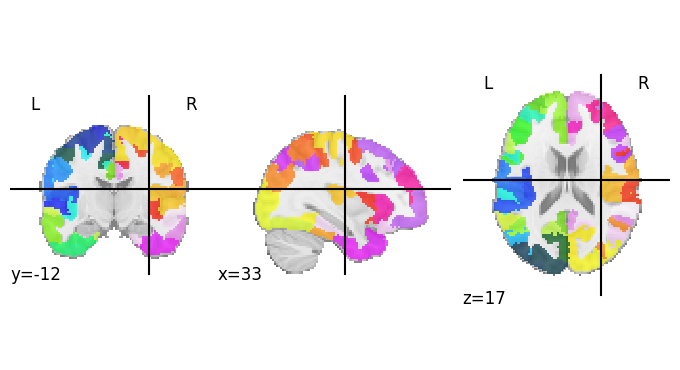

In [ ]:
schaefer_rois = image.resample_to_img(schaefer_parc['maps'],spmt_files[0], interpolation='nearest')
print("Shape of the resampled ROI map: {}".format(schaefer_rois.shape))
plotting.plot_roi(schaefer_rois)

### check how many functional parcellations are there in the atlas


In [ ]:
roin_ints = schaefer_rois.get_fdata()
np.unique(roin_ints)

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

## pre-processing: get an average value for each roi in the input images, so we have an output of 100 * 101 as the output, which we will use as X for the XGBoost algorithm.


In [ ]:
from nilearn.input_data import NiftiLabelsMasker
label_masker = NiftiLabelsMasker(labels_img=schaefer_rois, strategy='mean') # this func is defined to take the mean of each roi

X_100 = np.zeros((len(spmt_files), n_rois))

for idx, tstat in enumerate(spmt_files):
    # average ROIs for each file and add in new row of matrix X
    avg_roi = average_roi(label_masker,tstat)
    X_100[idx,:] = avg_roi

## plot the average functional image for each task condition

### get a separate list of spmt files for each condition

In [ ]:
spmt_files_aeve = [spmt for idx, spmt in enumerate(spmt_files) if dat_spmt.label[idx] == 'aeve']
spmt_files_aevh = [spmt for idx, spmt in enumerate(spmt_files) if dat_spmt.label[idx] == 'aevh']
spmt_files_ahve = [spmt for idx, spmt in enumerate(spmt_files) if dat_spmt.label[idx] == 'ahve']
spmt_files_ahvh = [spmt for idx, spmt in enumerate(spmt_files) if dat_spmt.label[idx] == 'ahvh']

func_mean_aeve = image.mean_img(spmt_files_aeve)
func_mean_aevh = image.mean_img(spmt_files_aevh)
func_mean_ahve = image.mean_img(spmt_files_ahve)
func_mean_ahvh = image.mean_img(spmt_files_ahvh)

In [ ]:
plotting.view_img_on_surf(
    stat_map_img=func_mean_aeve,
    surf_mesh='fsaverage5', threshold='75%')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plotting.view_img_on_surf(
    stat_map_img=func_mean_aevh,
    surf_mesh='fsaverage5', threshold='75%')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plotting.view_img_on_surf(
    stat_map_img=func_mean_ahve,
    surf_mesh='fsaverage5', threshold='75%')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plotting.view_img_on_surf(
    stat_map_img=func_mean_ahvh,
    surf_mesh='fsaverage5', threshold='75%')

Output hidden; open in https://colab.research.google.com to view.

### encode labels as numbers

In [ ]:
## encode labels as numbers

le = LabelEncoder()
le.fit(dat_spmt.label)
y = le.transform(dat_spmt.label)
y

array([0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1,
       2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3,
       0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1,
       2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3,
       0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3])

# Baseline Model

## the model

In [ ]:
if set_env == 0:
   xgb_model = xgb.XGBClassifier()
else:
   xgb_model = xgb.XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')

scaler = StandardScaler()

from sklearn.pipeline import Pipeline

pipeline_to_make = [('varthres', VarianceThreshold()),
                    ('preproc', scaler),
                    ('xgb_model', xgb_model)]

my_pipe = Pipeline(pipeline_to_make)

sss = StratifiedKFold(n_splits=5, shuffle=False, random_state=None)

## hyperparameters: the grid should be stored as a dictionary


In [ ]:
if hyper_tune == 1:
    hyper_grid = {
        'xgb_model__max_depth': np.arange(1, 3, 1),
        'xgb_model__learning_rate': np.arange(0.01, 0.05, 0.03),
        'xgb_model__gamma': np.arange(0, 2, 1),
        'xgb_model__colsample_bytree': np.arange(0.1, 0.4, 0.2),
        'xgb_model__n_estimators': np.arange(100, 151, 50),
    }
elif hyper_tune == 2:
    hyper_grid = {
        'xgb_model__max_depth': np.arange(1, 3, 1),
        'xgb_model__learning_rate': np.arange(0.01, 0.05, 0.03),
        'xgb_model__gamma': np.arange(0, 2, 1),
        'xgb_model__colsample_bytree': np.arange(0.1, 0.4, 0.2),
        'xgb_model__n_estimators': np.arange(100, 151, 50),
    }
elif hyper_tune == 3:
    hyper_grid = {
        'xgb_model__max_depth': np.arange(2, 4, 1),
        'xgb_model__learning_rate': np.arange(0.06999999999999999, 0.09, 0.03),
        'xgb_model__gamma': np.arange(0, 1, 1),
        'xgb_model__colsample_bytree': np.arange(0.1, 0.2, 0.2),
        'xgb_model__n_estimators': np.arange(100, 150, 50),
    }
else:
    hyper_grid = {
        'xgb_model__max_depth': np.arange(1, 7, 1),
        'xgb_model__learning_rate': np.arange(0.01, 0.16, 0.03),
        'xgb_model__gamma': np.arange(0, 8, 1),
        'xgb_model__colsample_bytree': np.arange(0.1, 0.9, 0.2),
        'xgb_model__n_estimators': np.arange(50, 301, 50),
    }

## fit the model

In [ ]:
CV = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV.fit(X_100, y)

## get the best model

In [ ]:
best_score = CV.best_score_
print("Best parameters: ", CV.best_params_)
print("Best score: ", best_score)
best_model = CV.best_estimator_
tuned_xgb = best_model['xgb_model']

## save the best model
#### the model can be saved and loaded later for visualisation and further analysis.

In [ ]:
dump(best_model, "best_xgboost_state_x400.joblib")

## load the best model (if needed)

In [ ]:
best_model = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400.joblib")
tuned_xgb = best_model['xgb_model']

[09:58:52] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.



# Visualisation (Baseline Model)

## Plot confusion matrix

### get model predictions for the validation batch during training

In [ ]:
actual_classes, predicted_classes, _ = cross_val_predict(best_model, sss, X_100, y)

### plot the confusion matrix

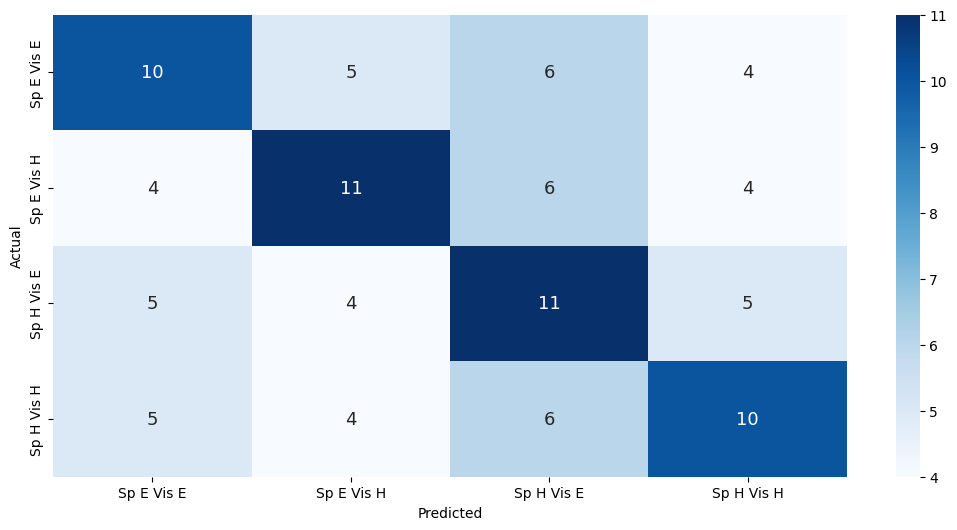

In [ ]:
def plot_confusion_matrix(actual_classes: np.array, predicted_classes: np.array, sorted_labels: list, sorted_classes: list):
    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)
    #sorted_labels = ['aeve', 'aevh', 'ahve', 'ahvh']
    plt.figure(figsize=(12.8,6))
    sns.heatmap(matrix, annot=True, xticklabels=sorted_classes, yticklabels=sorted_classes, cmap="Blues", fmt="g", annot_kws={'size': 13})
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('')
    sns.set(font_scale=1.1)
    plt.show()


plot_confusion_matrix(actual_classes, predicted_classes, [0, 1, 2, 3],['Sp E Vis E', 'Sp E Vis H', 'Sp H Vis E', 'Sp H Vis H'])


## Permutation test
### run a permutation test to compare with the chance level

In [ ]:
from sklearn.model_selection import permutation_test_score

score, perm_scores, pvalue = permutation_test_score(
    best_model, X_100, y, scoring="accuracy", cv=sss, n_permutations=1000, verbose=1
)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:  5.8min
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed: 13.0min
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed: 23.2min


### plot the test results

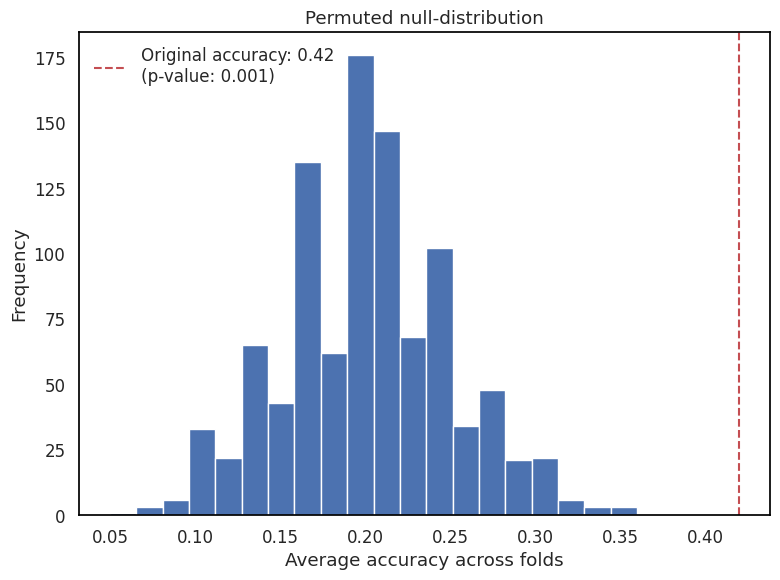

In [ ]:
plt.hist(perm_scores, bins=20, density=False)

plt.rcParams["figure.figsize"] = [8, 6]
plt.rcParams["figure.autolayout"] = True

ax = plt.gca()
ax.set_facecolor("white")

ax.spines['bottom'].set_color('0')
ax.spines['top'].set_color('0')
ax.spines['right'].set_color('0')
ax.spines['left'].set_color('0')
#ax.margins(0.1)


plt.title('')

plt.axvline(score, ls="--", color="r")
score_label = f"Observed accuracy: {score:.2f}\n(p-value: {pvalue:.3f})"
#ax.text(12, 10, score_label, fontsize=12)
plt.legend([score_label], frameon=False, loc='upper left')
plt.xlabel('Average accuracy across folds')
plt.ylabel('Frequency')



plt.show()

## Feature importance

### Set feature names

In [ ]:
tuned_xgb.get_booster().feature_names = feat_names_100

### Gain importance (not reported in the manuscript)

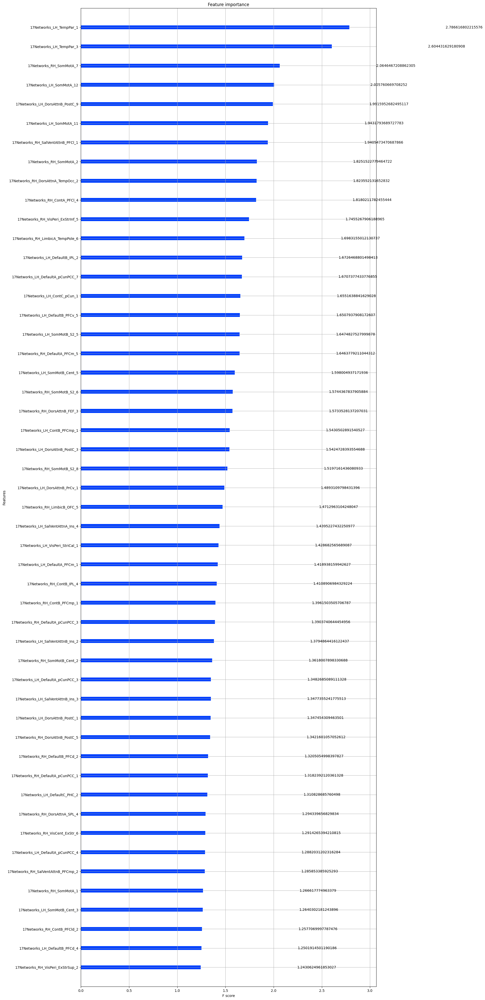

In [ ]:
ax = xgb.plot_importance(tuned_xgb.get_booster(),importance_type = "gain",max_num_features = 50)
fig = ax.figure
fig.set_size_inches(15, 50)

### Shap importance

In [ ]:
#imp_list = tuned_xgb.get_booster().get_score(importance_type='gain')
#imp_list

import shap

### load JS visualization code to notebook
shap.initjs()

explainer = shap.TreeExplainer(tuned_xgb)
shap_values = explainer.shap_values(X_100)

#### summary plot

In [ ]:
##### set plot style

plt.figure()
plt.rcParams["font.family"] = "DejaVu Sans"
plt.style.use('seaborn-white')

<Figure size 640x480 with 0 Axes>

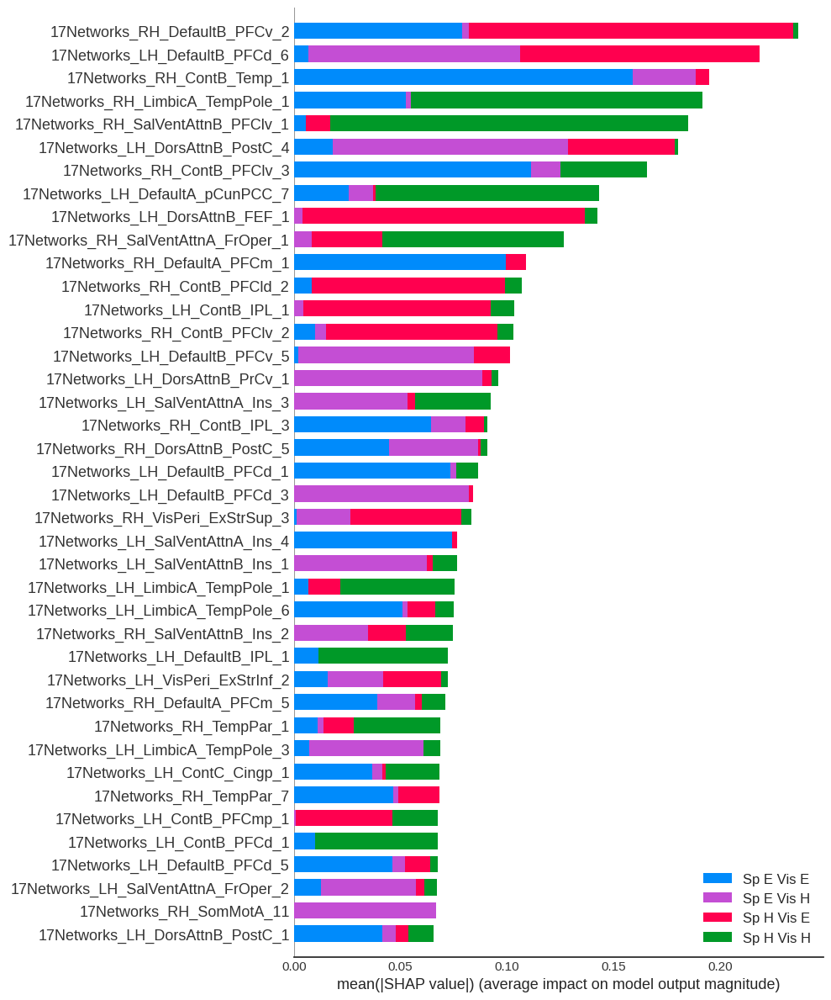

In [ ]:
shap.summary_plot(shap_values, features=X_100, feature_names=tuned_xgb.get_booster().feature_names, class_names = ['Sp E Vis E', 'Sp E Vis H', 'Sp H Vis E', 'Sp H Vis H'],class_inds='original',max_display = 40, plot_type = 'bar', plot_size = (10,12))

#### summary plot by class

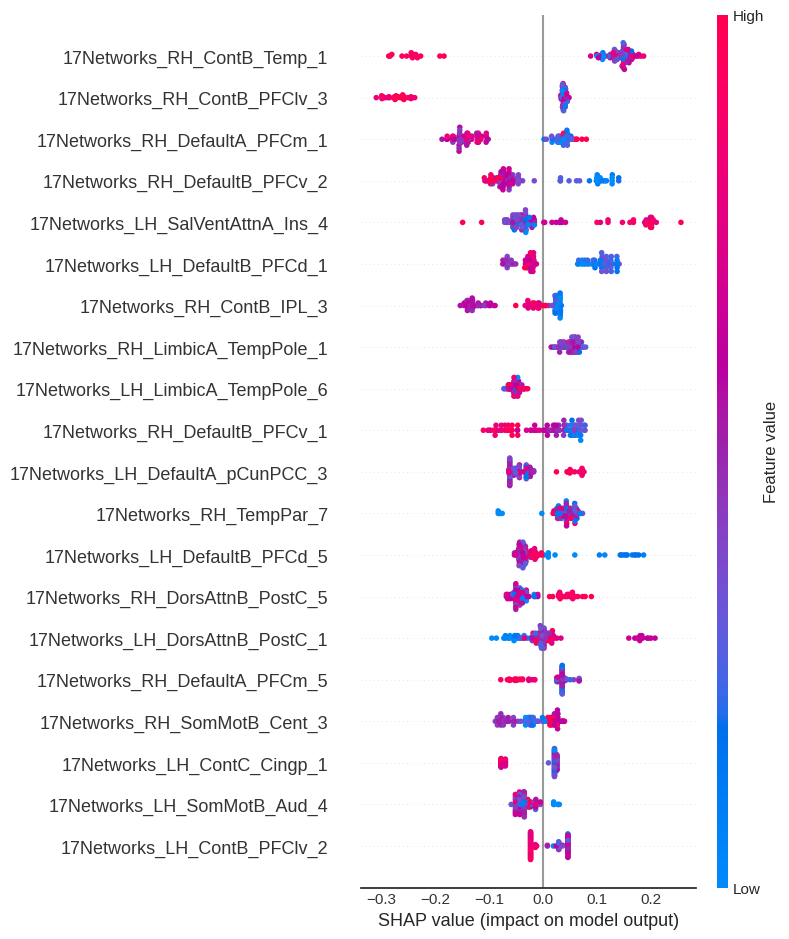

In [ ]:
shap.summary_plot(shap_values[0], X_100, feature_names=tuned_xgb.get_booster().feature_names) # class 0: SpE VisE

In [ ]:
shap.summary_plot(shap_values[1], X_100, feature_names=tuned_xgb.get_booster().feature_names) # class 1: SpE VisH

In [ ]:
shap.summary_plot(shap_values[2], X_100, feature_names=tuned_xgb.get_booster().feature_names) # class 2: SpH VisE

In [ ]:
shap.summary_plot(shap_values[3], X_100, feature_names=tuned_xgb.get_booster().feature_names) # class 3: SpH VisH

#### exploratory dependence plot

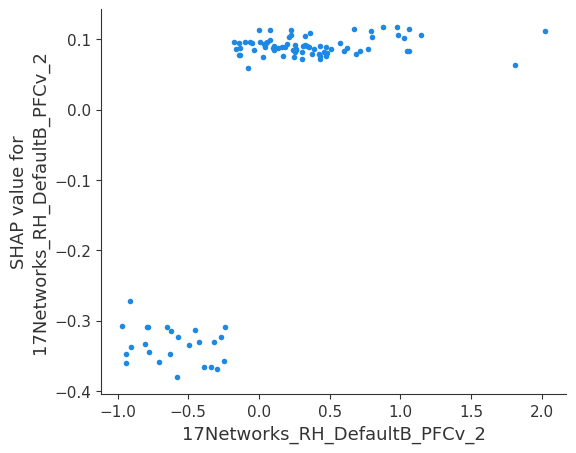

In [ ]:
shap.dependence_plot(382, shap_values[2], X_100, feature_names=tuned_xgb.get_booster().feature_names, interaction_index = None) # this is an example for examining the relationship between the SHAP values of two features

# Best model

## feature selection with shap (or gain)

### rank the features (shap)

In [ ]:
shap_values = explainer(X_100)
shap_importance = shap_values.abs.mean(0).values
shap_importance = np.sum(shap_importance, axis = 1)
importance_df_shap = pd.DataFrame({'features': tuned_xgb.get_booster().feature_names,
                              'importance': shap_importance.tolist()})
importance_df_shap.sort_values(by='importance', ascending=False, inplace=True)
importance_df_shap_sorted_idx = importance_df_shap.index.values.tolist()

importance_df_len = len(importance_df_shap_sorted_idx)

### rank the features (gain), not reported in the manuscript

In [ ]:
importance_df_gain = tuned_xgb.get_booster().get_score(importance_type='gain')
#importance_df_gain = sorted(importance_df_gain.items(), key=lambda x:x[1])
importance_df_gain = pd.DataFrame(importance_df_gain.items(), columns=['features', 'importance'])
importance_df_gain.sort_values(by='importance', ascending=False, inplace=True)
importance_df_gain_sorted_idx = importance_df_gain.index.values.tolist()

importance_df_len = len(importance_df_gain_sorted_idx)

### Iteratively fit the model with reduced features (descending order of importance)

In [ ]:
sort_by = 0 # 0: sort by shap, 1: sort by gain

hyper_grid_reduced = {
        'xgb_model__max_depth': [3],
        'xgb_model__learning_rate': [0.06999999999999999],
        'xgb_model__gamma': [0],
        'xgb_model__colsample_bytree': [0.1],
        'xgb_model__n_estimators': [100],
        }


feat_sel_max_acc = 0
feat_sel_max_roc_auc = 0
history = []

for i in range(1, importance_df_len+1):
  if sort_by == 0:
    feature_list = importance_df_shap_sorted_idx[0:i]
  else:
    feature_list = importance_df_gain_sorted_idx[0:i]
  #feature_list.sort()
  print(
      f'\nFitting model with top {i} features...'
      )


  X_100_reduced = X_100[:,feature_list]
  print(
      f'\nThe feature matrix has a shape: {X_100_reduced.shape}'
      )


  CV_reduced = GridSearchCV(my_pipe, hyper_grid_reduced, verbose=4, cv=sss, scoring = ["accuracy","roc_auc_ovo"], refit="roc_auc_ovo", error_score = 'raise')
  CV_reduced.fit(X_100_reduced, y)


  best_score_reduced_acc = CV_reduced.cv_results_['mean_test_accuracy'][0]
  best_score_reduced_roc_auc = CV_reduced.cv_results_['mean_test_roc_auc_ovo'][0]
  print("Current Acc: ", best_score_reduced_acc)
  print("Current ROC-AUC: ", best_score_reduced_roc_auc)
  history.append([best_score_reduced_acc, best_score_reduced_roc_auc])

  if best_score_reduced_acc > feat_sel_max_acc:
    feat_sel_max_acc = best_score_reduced_acc
    best_model_reduced = CV_reduced.best_estimator_
    tuned_xgb_reduced = best_model_reduced['xgb_model']
    X_100_reduced_bestscore = X_100_reduced
    best_model_nfeat_acc = i

  if best_score_reduced_roc_auc > feat_sel_max_roc_auc:
    feat_sel_max_roc_auc = best_score_reduced_roc_auc
    best_model_nfeat_roc_auc = i



print("Best Acc: ", feat_sel_max_acc)
print("Number of features (Best Acc): ", best_model_nfeat_acc)

print("Best Acc: ", feat_sel_max_roc_auc)
print("Number of features (Best ROC-AUC): ", best_model_nfeat_roc_auc)


history = pd.DataFrame(
    history,
    columns=[
        'acc', 'roc_auc'])


Fitting model with top 1 features...

The feature matrix has a shape: (100, 1)
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100; accuracy: (test=0.250) roc_auc_ovo: (test=0.530) total time=   0.6s
[CV 2/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100; accuracy: (test=0.350) roc_auc_ovo: (test=0.580) total time=   0.6s
[CV 3/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100; accuracy: (test=0.350) roc_auc_ovo: (test=0.660) total time=   0.6s
[CV 4/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=10

### Plot performance results per number of features

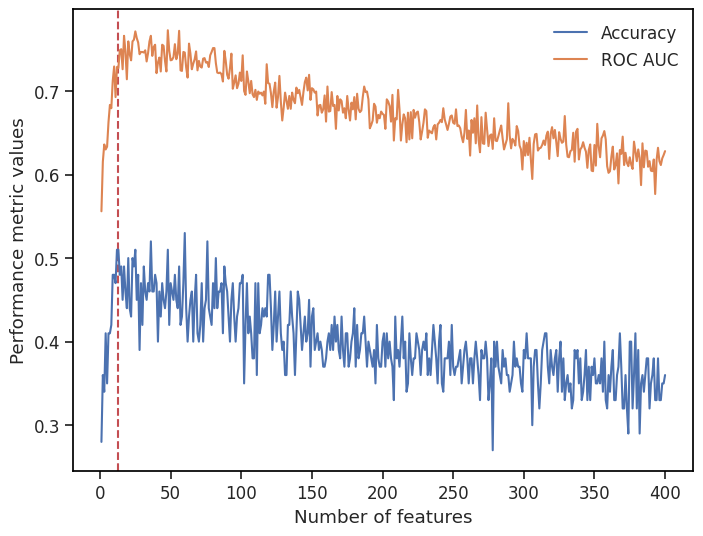

In [ ]:
plt.figure(figsize=(8, 6))
#for c in ['acc','roc_auc']:
#    plt.plot(
#        history[c], label=c)

ax = plt.gca()
ax.set_facecolor("white")

ax.spines['bottom'].set_color('0')
ax.spines['top'].set_color('0')
ax.spines['right'].set_color('0')
ax.spines['left'].set_color('0')




plt.axvline(13, ls="--", color="r")
plt.plot(np.arange(1,importance_df_len+1),history['acc'], label = 'Accuracy')
plt.plot(np.arange(1,importance_df_len+1),history['roc_auc'],label = 'ROC AUC')
plt.legend()
plt.xlabel('Number of features')
plt.ylabel('Performance metric values')
plt.title('')

plt.show()


### This is the model with selected features:

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100;, score=0.400 total time=   0.5s
[CV 2/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100;, score=0.550 total time=   0.5s
[CV 3/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100;, score=0.550 total time=   0.5s
[CV 4/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_estimators=100;, score=0.550 total time=   0.5s
[CV 5/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=3, xgb_model__n_esti

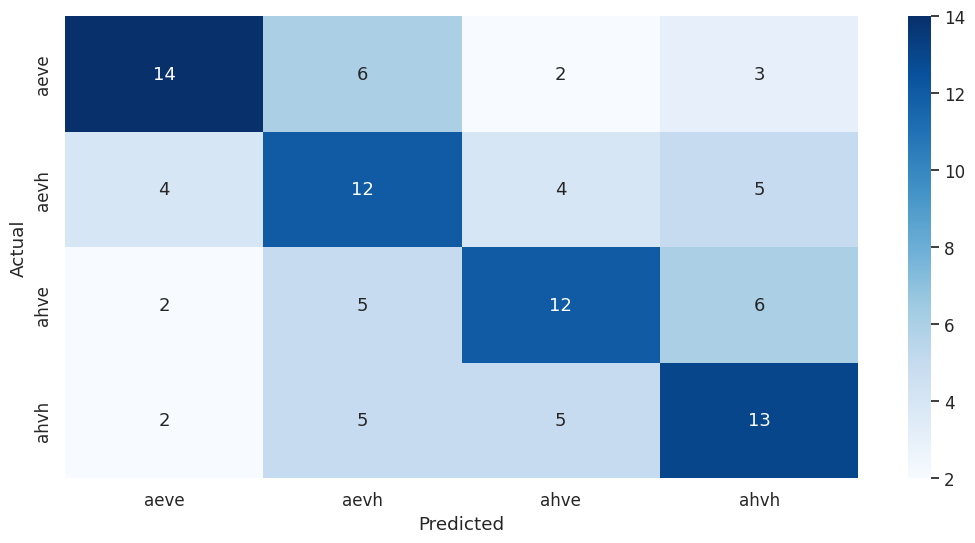

In [ ]:
#### 13 features

hyper_grid_reduced = {
        'xgb_model__max_depth': [3],
        'xgb_model__learning_rate': [0.06999999999999999],
        'xgb_model__gamma': [0],
        'xgb_model__colsample_bytree': [0.1],
        'xgb_model__n_estimators': [100],
        }



feature_list = importance_df_shap_sorted_idx[0:13]
#feature_list.sort()
X_100_reduced = X_100[:,feature_list]
CV_reduced = GridSearchCV(my_pipe, hyper_grid_reduced, verbose=4, cv=sss, error_score = 'raise')
CV_reduced.fit(X_100_reduced, y)

best_score_reduced = CV_reduced.best_score_
print("Current Acc: ", best_score_reduced)

best_model_reduced = CV_reduced.best_estimator_
tuned_xgb_reduced = best_model_reduced['xgb_model']

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced, sss, X_100_reduced, y)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1, 2, 3],['aeve', 'aevh', 'ahve', 'ahvh'])

### Save and load the reduced model

#### save the model

In [ ]:
dump(best_model_reduced, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_sortedidx.joblib")

['/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_sortedidx.joblib']

#### load the model

In [ ]:
best_model_reduced = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_sortedidx.joblib")
tuned_xgb_reduced = best_model_reduced['xgb_model']

## Grid search with the selected features to find the best parameters for this model:

In [ ]:
#### an extensive grid search again for parameters

dump_model_reduced_gridsearch = 1
plot_model_reduced_gridsearch = 1

feature_list = importance_df_shap_sorted_idx[0:12]
#feature_list.sort()
X_100_reduced = X_100[:,feature_list]
CV_reduced_gridsearch = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch.fit(X_100_reduced, y)

best_score_reduced_gridsearch = CV_reduced_gridsearch.best_score_
print("Best accuracy: ", best_score_reduced_gridsearch)
print("Best parameters: ", CV_reduced_gridsearch.best_params_)


best_model_reduced_gridsearch = CV_reduced_gridsearch.best_estimator_
tuned_xgb_reduced_gridsearch = best_model_reduced_gridsearch['xgb_model']

if dump_model_reduced_gridsearch == 1:
  dump(best_model_reduced_gridsearch, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_sortedidx_240215.joblib")

if plot_model_reduced_gridsearch == 1:
  actual_classes_reduced_gridsearch, predicted_classes_reduced_gridsearch, _ = cross_val_predict(best_model_reduced_gridsearch, sss, X_100_reduced, y)
  plot_confusion_matrix(actual_classes_reduced_gridsearch, predicted_classes_reduced_gridsearch, [0, 1, 2, 3])


Streaming output truncated to the last 5000 lines.
[CV 3/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.400 total time=   0.3s
[CV 4/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.450 total time=   0.3s
[CV 5/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.250 total time=   0.3s
[CV 1/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=200;, score=0.350 total time=   0.3s
[CV 2/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_

TypeError: plot_confusion_matrix() missing 1 required positional argument: 'sorted_classes'

### Confusion matrix of the best model

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END xgb_model__colsample_bytree=0.30000000000000004, xgb_model__gamma=0, xgb_model__learning_rate=0.09999999999999999, xgb_model__max_depth=5, xgb_model__n_estimators=50;, score=0.600 total time=   0.2s
[CV 2/5] END xgb_model__colsample_bytree=0.30000000000000004, xgb_model__gamma=0, xgb_model__learning_rate=0.09999999999999999, xgb_model__max_depth=5, xgb_model__n_estimators=50;, score=0.600 total time=   0.3s
[CV 3/5] END xgb_model__colsample_bytree=0.30000000000000004, xgb_model__gamma=0, xgb_model__learning_rate=0.09999999999999999, xgb_model__max_depth=5, xgb_model__n_estimators=50;, score=0.600 total time=   0.4s
[CV 4/5] END xgb_model__colsample_bytree=0.30000000000000004, xgb_model__gamma=0, xgb_model__learning_rate=0.09999999999999999, xgb_model__max_depth=5, xgb_model__n_estimators=50;, score=0.550 total time=   0.2s
[CV 5/5] END xgb_model__colsample_bytree=0.30000000000000004, xgb_model__gamma=0, xgb_model__

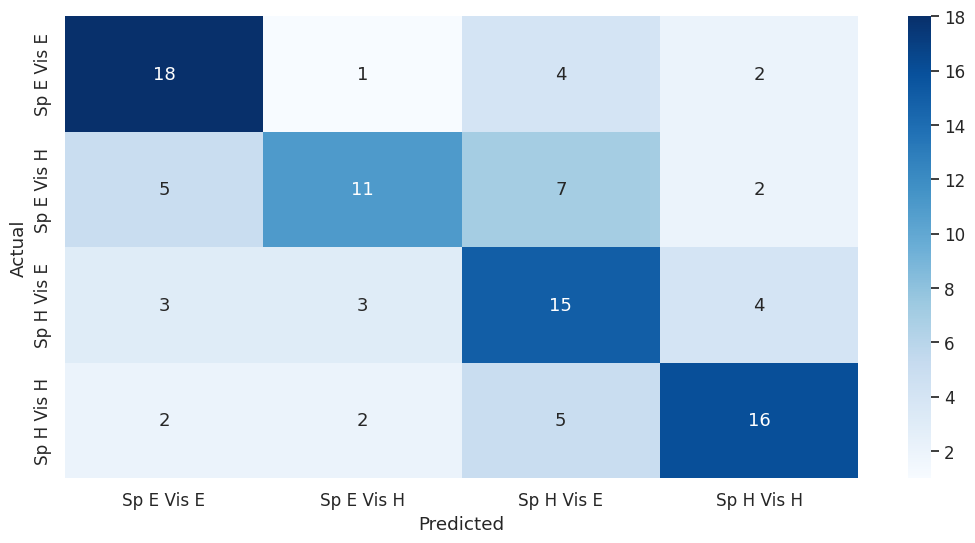

In [ ]:
#### 13 features

# abandoned:
#hyper_grid_reduced = {
#        'xgb_model__max_depth': [3],
#        'xgb_model__learning_rate': [0.06999999999999999],
#        'xgb_model__gamma': [0],
#        'xgb_model__colsample_bytree': [0.1],
#        'xgb_model__n_estimators': [100],
#        }

# best hyperparameter, 13 feat:
#hyper_grid_reduced = {
#        'xgb_model__max_depth': [4],
#        'xgb_model__learning_rate': [0.09999999999999999],
#        'xgb_model__gamma': [0],
#        'xgb_model__colsample_bytree': [0.7000000000000001],
#        'xgb_model__n_estimators': [150],
#        }

# best hyperparameter, 12 feat:

hyper_grid_reduced = {
        'xgb_model__max_depth': [5],
        'xgb_model__learning_rate': [0.09999999999999999],
        'xgb_model__gamma': [0],
        'xgb_model__colsample_bytree': [0.30000000000000004],
        'xgb_model__n_estimators': [50],
        }

feature_list = importance_df_shap_sorted_idx[0:12]
#feature_list.sort()
X_100_reduced = X_100[:,feature_list]
CV_reduced_gridsearch = GridSearchCV(my_pipe, hyper_grid_reduced, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch.fit(X_100_reduced, y)

best_score_reduced_gridsearch = CV_reduced_gridsearch.best_score_
print("Current Acc: ", best_score_reduced_gridsearch)

best_model_reduced_gridsearch = CV_reduced_gridsearch.best_estimator_
tuned_xgb_reduced_gridsearch = best_model_reduced_gridsearch['xgb_model']

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced_gridsearch, sss, X_100_reduced, y)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1, 2, 3],['Sp E Vis E', 'Sp E Vis H', 'Sp H Vis E', 'Sp H Vis H'])

In [ ]:
# top-13 feature model, accuracy

with open('/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/meanacc_reduced_gridsearch.txt', 'w') as f:
    for line in CV_reduced_gridsearch.cv_results_['mean_test_accuracy']:
        f.write(f"{line}\n")

In [ ]:
# top-13 feature model, auc

with open('/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/meanauc_reduced_gridsearch.txt', 'w') as f:
    for line in CV_reduced_gridsearch.cv_results_['mean_test_roc_auc_ovo']:
        f.write(f"{line}\n")

In [ ]:
# top-13 feature model, auc

with open('/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/meanacc_reduced_gridsearch_12feat.txt', 'w') as f:
    for line in CV_reduced_gridsearch.cv_results_['mean_test_score']:
        f.write(f"{line}\n")

In [ ]:
# top-13 feature model, acc

print(CV_reduced_gridsearch.cv_results_['params'][4448])

{'xgb_model__colsample_bytree': 0.7000000000000001, 'xgb_model__gamma': 0, 'xgb_model__learning_rate': 0.09999999999999999, 'xgb_model__max_depth': 4, 'xgb_model__n_estimators': 150}


In [ ]:
# top-12 feature model, acc

print(CV_reduced_gridsearch.cv_results_['params'][1572])

{'xgb_model__colsample_bytree': 0.30000000000000004, 'xgb_model__gamma': 0, 'xgb_model__learning_rate': 0.09999999999999999, 'xgb_model__max_depth': 5, 'xgb_model__n_estimators': 50}


# Feature Importance (Best model)

In [ ]:
feat_name_reduced = [feat_names_100[i] for i in feature_list]

## SHAP Importance



### Overall Importance by features

#### Set feature names

In [ ]:
tuned_xgb_reduced_gridsearch.get_booster().feature_names = feat_name_reduced

In [ ]:
feature_list

[382, 179, 335, 318, 304, 75, 347, 159, 81, 292, 367, 342]

In [ ]:
feat_name_reduced

['17Networks_RH_DefaultB_PFCv_2',
 '17Networks_LH_DefaultB_PFCd_6',
 '17Networks_RH_ContB_Temp_1',
 '17Networks_RH_LimbicA_TempPole_1',
 '17Networks_RH_SalVentAttnB_PFClv_1',
 '17Networks_LH_DorsAttnB_PostC_4',
 '17Networks_RH_ContB_PFClv_3',
 '17Networks_LH_DefaultA_pCunPCC_7',
 '17Networks_LH_DorsAttnB_FEF_1',
 '17Networks_RH_SalVentAttnA_FrOper_1',
 '17Networks_RH_DefaultA_PFCm_1',
 '17Networks_RH_ContB_PFCld_2']

In [ ]:
#### feature names following Harvard-Oxford atlas, 13 feat:

feat_name_reduced = ['right IFG (orbitalis) [48,32,-8]',
 'left SFG [-6,10,65]',
 'right ITG (posterior) [62,-28,-20]',
 'right fusiform (anterior) [28,-1,-40]',
 'right IFG (triangularis) [49,40,5]',
 'left PoCG [-46,-29,44]',
 'right frontal pole [42,51,-6]',
 'left precuneus cortex [-7,-51,43]',
 'left preCG [-40,-3,51]',
 'right insula [38,7,11]',
 'right PaCG [5,41,-11]',
 'right MFG [45,19,44]',
 'left angular gyrus [-49,-60,47]']

tuned_xgb_reduced_gridsearch.get_booster().feature_names = feat_name_reduced

In [ ]:
#### feature names following Harvard-Oxford atlas, 12 feat:

feat_name_reduced = ['right IFG (orbitalis) [48,32,-8]',
 'left SFG [-6,10,65]',
 'right ITG (posterior) [62,-28,-20]',
 'right fusiform (anterior) [28,-1,-40]',
 'right IFG (triangularis) [49,40,5]',
 'left PoCG [-46,-29,44]',
 'right frontal pole [42,51,-6]',
 'left precuneus cortex [-7,-51,43]',
 'left preCG [-40,-3,51]',
 'right insula [38,7,11]',
 'right PaCG [5,41,-11]',
 'right MFG [45,19,44]']

tuned_xgb_reduced_gridsearch.get_booster().feature_names = feat_name_reduced

#### Shap values

In [ ]:
shap.initjs()

explainer_reduced = shap.TreeExplainer(tuned_xgb_reduced_gridsearch)
shap_values_reduced = explainer_reduced.shap_values(X_100_reduced)
shap_values_reduced

[array([[ 0.08880073,  0.07121029, -0.21121803, ...,  0.0998812 ,
          0.13777283,  0.03000853],
        [-0.278442  ,  0.06533201,  0.27630836, ..., -0.01659775,
         -0.4458788 ,  0.08286796],
        [-0.4277243 ,  0.04984499,  0.31789938, ..., -0.09010337,
         -0.4559529 , -0.02156913],
        ...,
        [-0.3033333 , -0.08339864, -0.2865538 , ..., -0.07293404,
          0.11244667, -0.02917209],
        [-0.25259873, -0.03461955,  0.26637852, ..., -0.04035138,
          0.09248026, -0.12591971],
        [-0.31228566, -0.08436477,  0.18852139, ...,  0.10232184,
          0.10095385, -0.02450709]], dtype=float32),
 array([[ 0.01243574, -0.4609103 , -0.16320431, ...,  0.18196954,
         -0.08598083, -0.10055051],
        [ 0.11047832,  0.0114144 , -0.30060846, ..., -0.30935326,
         -0.07955909, -0.02572206],
        [ 0.08608964, -0.43650806, -0.19312295, ...,  0.1541229 ,
         -0.09793884, -0.0762274 ],
        ...,
        [-0.03905823, -0.42681652, -0.1

#### summary plot

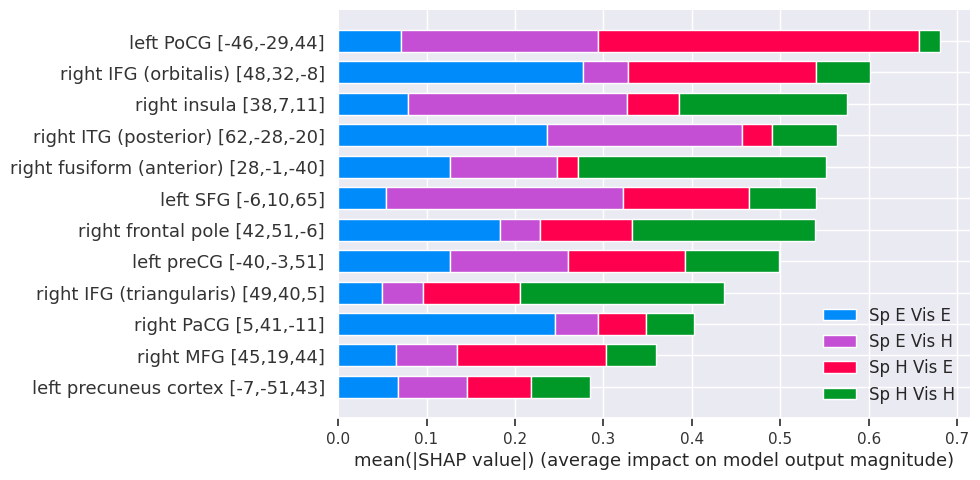

In [ ]:
shap.summary_plot(shap_values_reduced, features=X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names, max_display = 16, plot_type = 'bar',class_names={0: 'Sp E Vis E', 1: 'Sp E Vis H', 2: 'Sp H Vis E', 3: 'Sp H Vis H'}, class_inds='original',plot_size = (10,5))

### Importance by class

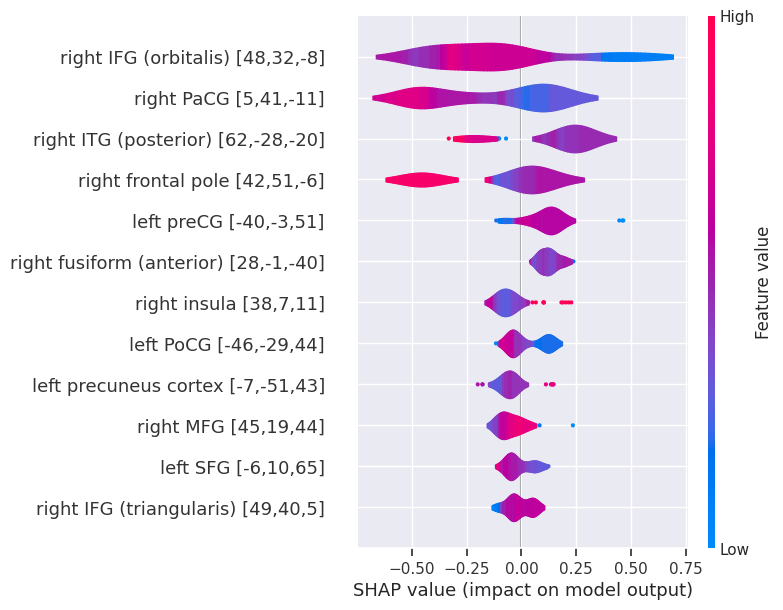

In [ ]:
shap.summary_plot(shap_values_reduced[0], X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names,plot_type = 'violin') # class 0

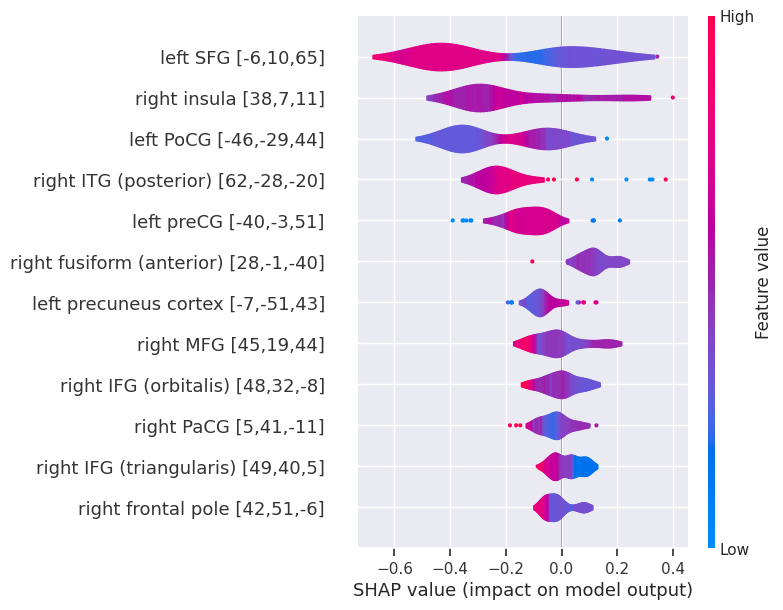

In [ ]:
shap.summary_plot(shap_values_reduced[1], X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names,plot_type = 'violin') # class 1

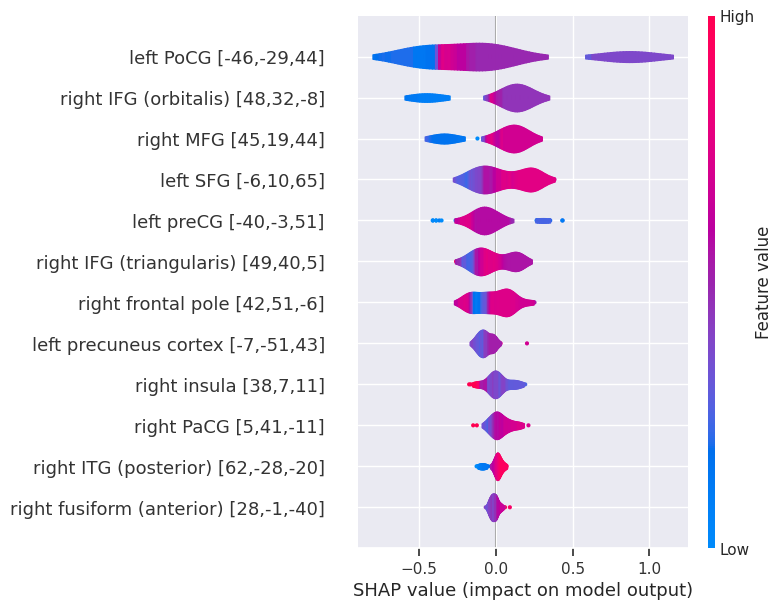

In [ ]:
shap.summary_plot(shap_values_reduced[2], X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names,plot_type = 'violin') # class 2

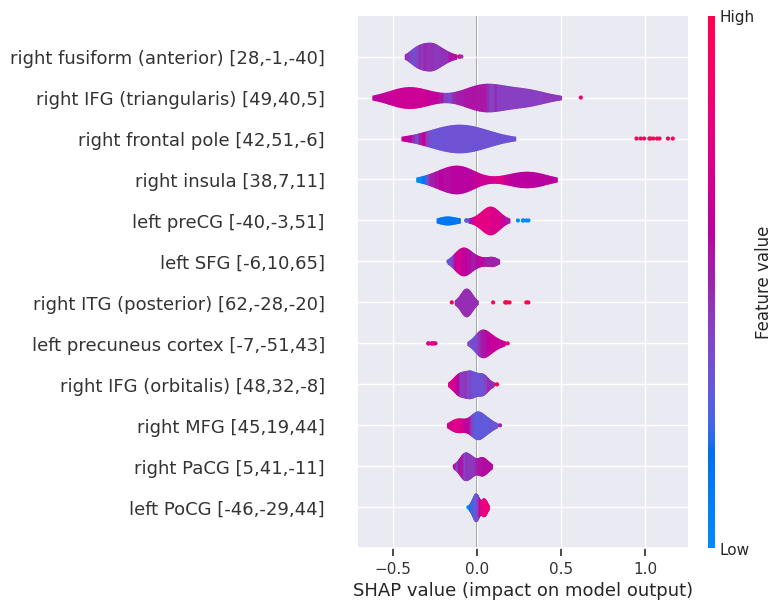

In [ ]:
shap.summary_plot(shap_values_reduced[3], X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names,plot_type = 'violin') # class 3

### Dependence plots (for exploratory analysis)

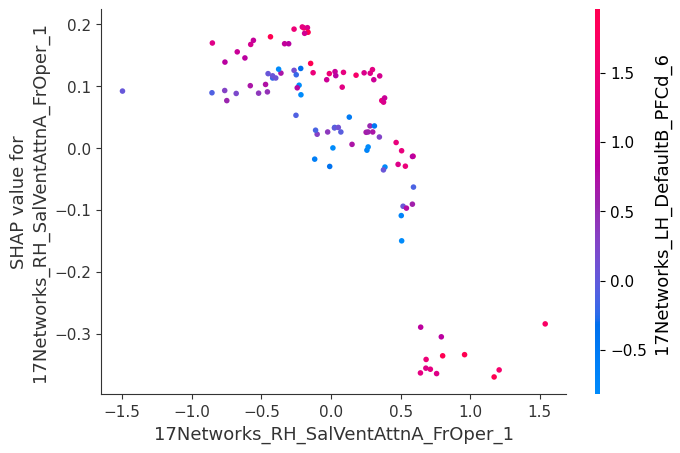

In [ ]:
shap.dependence_plot(9, shap_values_reduced[2], X_100_reduced, feature_names=tuned_xgb_reduced_gridsearch.get_booster().feature_names, interaction_index = 'auto')

# Train separate binary classification models per two classes for inference

### Class 0 vs Class 1

#### fit and save the model

In [ ]:
#### 13 features

#feature_list.sort()

idx_0_1 = [i for i, element in enumerate(y) if element in (0, 1)]

X_100_reduced_0_1 = X_100[idx_0_1][:,feature_list]
y_0_1 = y[idx_0_1]

In [ ]:
CV_reduced_gridsearch_0_1 = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch_0_1.fit(X_100_reduced_0_1, y_0_1)

best_score_reduced_gridsearch_0_1 = CV_reduced_gridsearch_0_1.best_score_
print("Current Acc: ", best_score_reduced_gridsearch_0_1)
print("Best parameters: ", CV_reduced_gridsearch_0_1.best_params_)

best_model_reduced_gridsearch_0_1 = CV_reduced_gridsearch_0_1.best_estimator_
tuned_xgb_reduced_gridsearch_0_1 = best_model_reduced_gridsearch_0_1['xgb_model']

dump(best_model_reduced_gridsearch_0_1, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_0_1.joblib")

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced_gridsearch_0_1, sss, X_100_reduced_0_1, y_0_1)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1], ['aeve','aevh'])

Fitting 5 folds for each of 5760 candidates, totalling 28800 fits
[CV 1/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.01, xgb_model__max_depth=1, xgb_model__n_estimators=50;, score=0.600 total time=   0.0s
[CV 2/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.01, xgb_model__max_depth=1, xgb_model__n_estimators=50;, score=0.500 total time=   0.0s
[CV 3/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.01, xgb_model__max_depth=1, xgb_model__n_estimators=50;, score=0.800 total time=   0.0s
[CV 4/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.01, xgb_model__max_depth=1, xgb_model__n_estimators=50;, score=0.500 total time=   0.0s
[CV 5/5] END xgb_model__colsample_bytree=0.1, xgb_model__gamma=0, xgb_model__learning_rate=0.01, xgb_model__max_depth=1, xgb_model__n_estimators=50;, score=0.300 total time=   0.0s
[CV 1/5] END xgb_model__colsa

KeyboardInterrupt: 

#### load the best model

In [ ]:
best_model_reduced_gridsearch_0_1 = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_0_1.joblib")
tuned_xgb_reduced_gridsearch_0_1 = best_model_reduced_gridsearch_0_1['xgb_model']

### Class 2 vs Class 3

In [ ]:
#### 13 features

#feature_list.sort()

idx_2_3 = [i for i, element in enumerate(y) if element in (2, 3)]

X_100_reduced_2_3 = X_100[idx_2_3][:,feature_list]
y_2_3 = dat_spmt.label.iloc[idx_2_3]

le.fit(y_2_3)
y_2_3 = le.transform(y_2_3)

Streaming output truncated to the last 5000 lines.
[CV 3/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.400 total time=   0.1s
[CV 4/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.600 total time=   0.1s
[CV 5/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.500 total time=   0.1s
[CV 1/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=200;, score=0.400 total time=   0.1s
[CV 2/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_

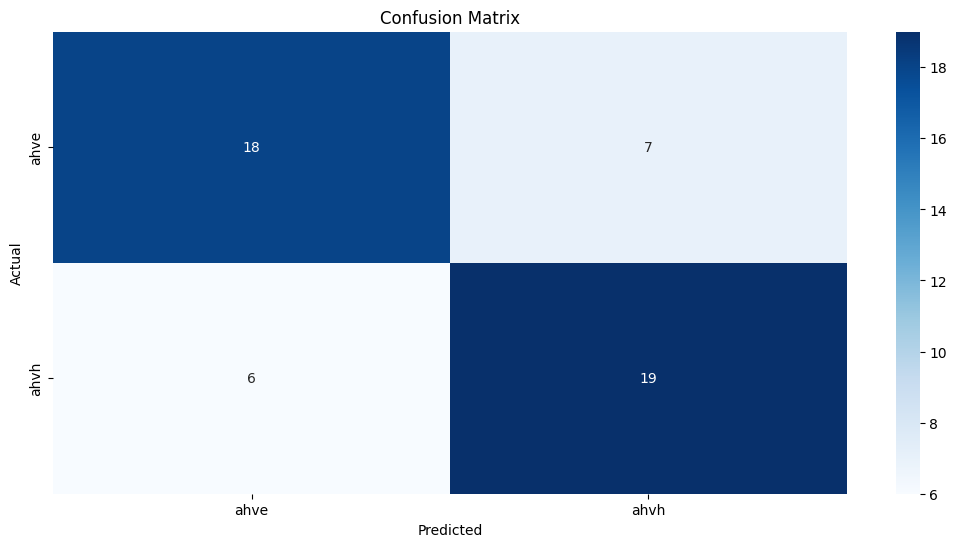

In [ ]:
CV_reduced_gridsearch_2_3 = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch_2_3.fit(X_100_reduced_2_3, y_2_3)

best_score_reduced_gridsearch_2_3 = CV_reduced_gridsearch_2_3.best_score_
print("Current Acc: ", best_score_reduced_gridsearch_2_3)
print("Best parameters: ", CV_reduced_gridsearch_2_3.best_params_)

best_model_reduced_gridsearch_2_3 = CV_reduced_gridsearch_2_3.best_estimator_
tuned_xgb_reduced_gridsearch_2_3 = best_model_reduced_gridsearch_2_3['xgb_model']

dump(best_model_reduced_gridsearch_2_3, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_2_3.joblib")

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced_gridsearch_2_3, sss, X_100_reduced_2_3, y_2_3)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1], ['ahve','ahvh'])

#### load the best model

In [ ]:
best_model_reduced_gridsearch_2_3 = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_2_3.joblib")
tuned_xgb_reduced_gridsearch_2_3 = best_model_reduced_gridsearch_2_3['xgb_model']

### Class 0 vs Class 2


In [ ]:
#### 13 features

#feature_list.sort()

idx_0_2 = [i for i, element in enumerate(y) if element in (0, 2)]

X_100_reduced_0_2 = X_100[idx_0_2][:,feature_list]
y_0_2 = dat_spmt.label.iloc[idx_0_2]

le.fit(y_0_2)
y_0_2 = le.transform(y_0_2)

Streaming output truncated to the last 5000 lines.
[CV 3/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.500 total time=   0.1s
[CV 4/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.700 total time=   0.1s
[CV 5/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.900 total time=   0.1s
[CV 1/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=200;, score=0.600 total time=   0.1s
[CV 2/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_

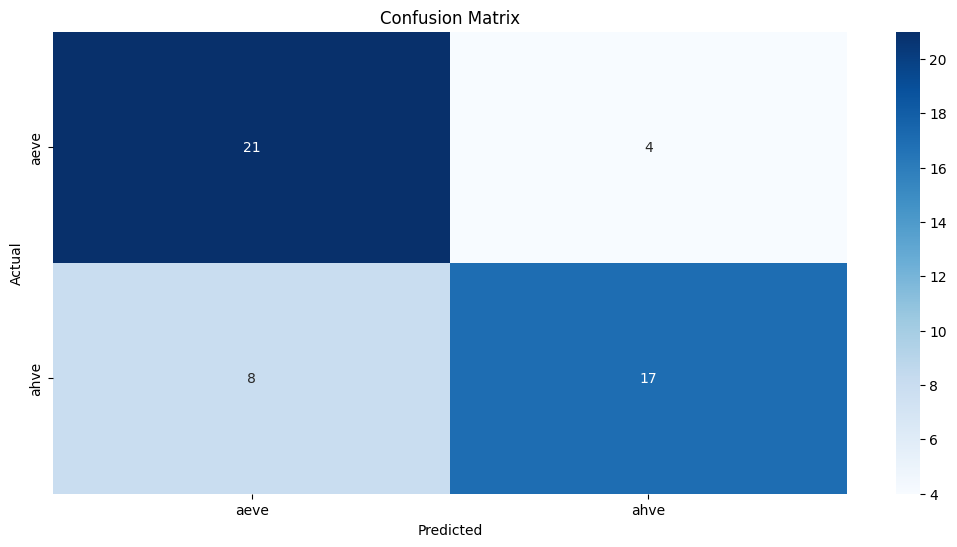

In [ ]:
CV_reduced_gridsearch_0_2 = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch_0_2.fit(X_100_reduced_0_2, y_0_2)

best_score_reduced_gridsearch_0_2 = CV_reduced_gridsearch_0_2.best_score_
print("Current Acc: ", best_score_reduced_gridsearch_0_2)
print("Best parameters: ", CV_reduced_gridsearch_0_2.best_params_)

best_model_reduced_gridsearch_0_2 = CV_reduced_gridsearch_0_2.best_estimator_
tuned_xgb_reduced_gridsearch_0_2 = best_model_reduced_gridsearch_0_2['xgb_model']

dump(best_model_reduced_gridsearch_0_2, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_0_2.joblib")

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced_gridsearch_0_2, sss, X_100_reduced_0_2, y_0_2)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1], ['aeve','ahve'])

#### load the best model

In [ ]:
best_model_reduced_gridsearch_0_2 = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_0_2.joblib")
tuned_xgb_reduced_gridsearch_0_2 = best_model_reduced_gridsearch_0_2['xgb_model']

### Class 1 vs Class 3

In [ ]:
#### 13 features

#feature_list.sort()

idx_1_3 = [i for i, element in enumerate(y) if element in (1, 3)]

X_100_reduced_1_3 = X_100[idx_1_3][:,feature_list]
y_1_3 = dat_spmt.label.iloc[idx_1_3]

le.fit(y_1_3)
y_1_3 = le.transform(y_1_3)

Streaming output truncated to the last 5000 lines.
[CV 3/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.500 total time=   0.1s
[CV 4/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.400 total time=   0.1s
[CV 5/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=150;, score=0.600 total time=   0.1s
[CV 1/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_rate=0.06999999999999999, xgb_model__max_depth=2, xgb_model__n_estimators=200;, score=0.800 total time=   0.1s
[CV 2/5] END xgb_model__colsample_bytree=0.7000000000000001, xgb_model__gamma=2, xgb_model__learning_

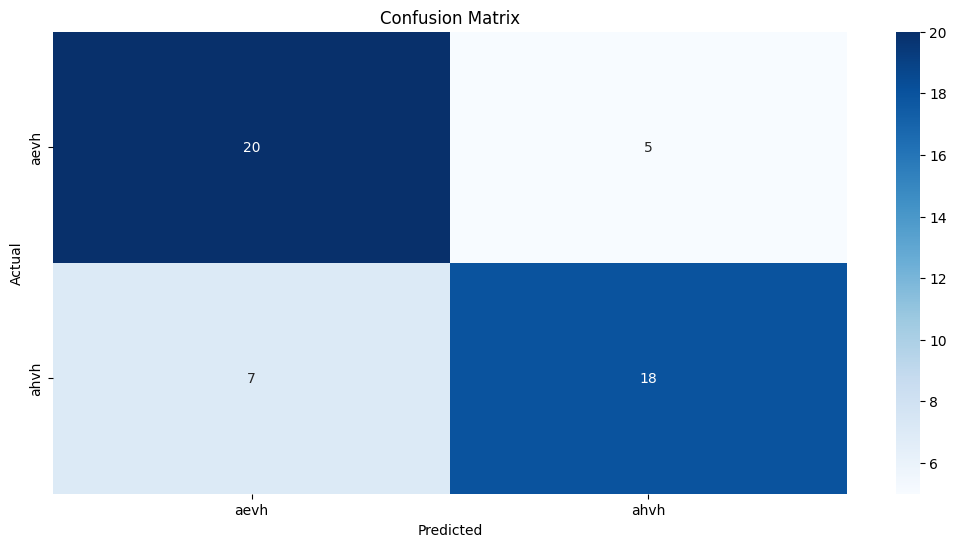

In [ ]:
CV_reduced_gridsearch_1_3 = GridSearchCV(my_pipe, hyper_grid, verbose=4, cv=sss, error_score = 'raise')
CV_reduced_gridsearch_1_3.fit(X_100_reduced_1_3, y_1_3)

best_score_reduced_gridsearch_1_3 = CV_reduced_gridsearch_1_3.best_score_
print("Current Acc: ", best_score_reduced_gridsearch_1_3)
print("Best parameters: ", CV_reduced_gridsearch_1_3.best_params_)

best_model_reduced_gridsearch_1_3 = CV_reduced_gridsearch_1_3.best_estimator_
tuned_xgb_reduced_gridsearch_1_3 = best_model_reduced_gridsearch_1_3['xgb_model']

dump(best_model_reduced_gridsearch_1_3, "/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_1_3.joblib")

actual_classes_reduced, predicted_classes_reduced, _ = cross_val_predict(best_model_reduced_gridsearch_1_3, sss, X_100_reduced_1_3, y_1_3)
plot_confusion_matrix(actual_classes_reduced, predicted_classes_reduced, [0, 1], ['aevh','ahvh'])

#### load the best model

In [ ]:
best_model_reduced_gridsearch_1_3 = load("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/best_models/best_xgboost_state_x400_reduced_gridsearch_1_3.joblib")
tuned_xgb_reduced_gridsearch_1_3 = best_model_reduced_gridsearch_1_3['xgb_model']

# Feature Importance (binary classification models)

## SHAP Importance

### Class 0 vs Class 1

#### feature names

In [ ]:
tuned_xgb_reduced_gridsearch_0_1.get_booster().feature_names = feat_name_reduced

####  shap values

In [ ]:
shap.initjs()

explainer_reduced_0_1 = shap.TreeExplainer(tuned_xgb_reduced_gridsearch_0_1)
shap_values_reduced_0_1 = explainer_reduced_0_1.shap_values(X_100_reduced_0_1)
shap_values_reduced_0_1

array([[ 4.06509846e-01,  3.13316464e-01, -4.46495861e-01,
        -2.92755663e-01, -5.28530451e-04, -8.24511588e-01,
        -2.43288428e-02, -4.42733586e-01, -6.93826452e-02,
         1.43778339e-01,  2.50684731e-02, -4.97268528e-01,
         4.54807281e-02],
       [ 4.55464512e-01, -2.29516670e-01, -4.46495861e-01,
        -4.68294322e-02,  3.94698709e-01, -5.15391454e-02,
         2.43443340e-01,  1.45500037e-03, -6.93826452e-02,
        -3.34561951e-02,  3.79421979e-01, -3.43961746e-01,
         5.69666252e-02],
       [-3.83426249e-01,  3.13316464e-01, -4.46495861e-01,
        -2.92755663e-01,  3.20955515e-01, -8.24511588e-01,
        -2.43288428e-02,  1.45500037e-03, -6.93826452e-02,
        -3.34561951e-02,  3.79421979e-01,  2.16184899e-01,
         5.69666252e-02],
       [-3.83426249e-01, -2.57435173e-01, -4.46495861e-01,
        -2.92755663e-01,  3.94698709e-01,  2.63689570e-02,
         2.43443340e-01,  1.45500037e-03, -6.93826452e-02,
        -3.34561951e-02, -7.28131384e

####  Plots

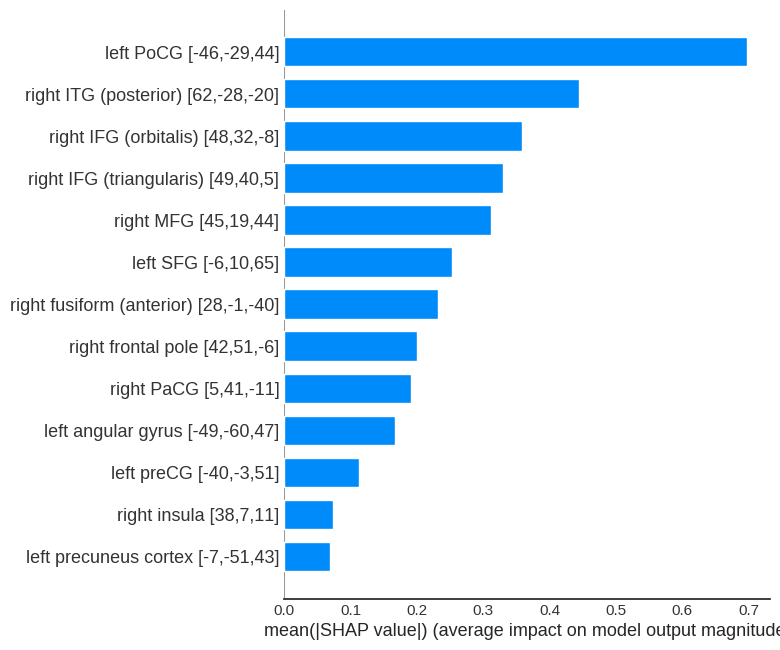

In [ ]:
shap.summary_plot(shap_values_reduced_0_1, features=X_100_reduced_0_1, feature_names=tuned_xgb_reduced_gridsearch_0_1.get_booster().feature_names, max_display = 16, plot_type = 'bar',class_names={0: 'Sp E Vis E', 1: 'Sp E Vis H', 2: 'Sp H Vis E', 3: 'Sp H Vis H'}, class_inds='original')

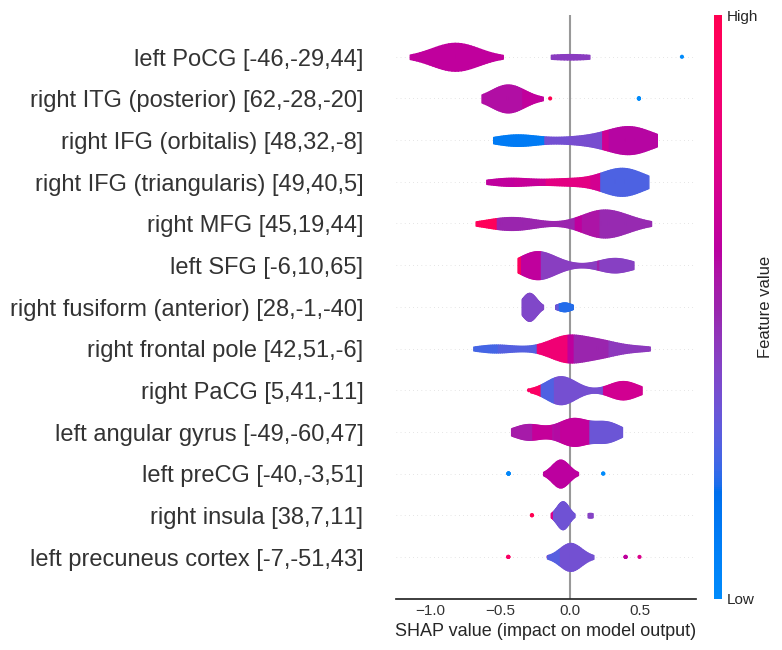

In [ ]:
plt.figure(figsize=None)
shap.summary_plot(shap_values_reduced_0_1, X_100_reduced_0_1, feature_names=tuned_xgb_reduced_gridsearch_0_1.get_booster().feature_names,plot_type = 'violin',show=False)
plt.yticks(fontsize=17)
plt.tight_layout()
plt.savefig("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/figures/class_0_1_13feat_nameupdateed.svg", format="svg")
plt.show()

### Class 2 vs Class 3

#### feature names

In [ ]:
tuned_xgb_reduced_gridsearch_2_3.get_booster().feature_names = feat_name_reduced

#### shap values

In [ ]:
shap.initjs()

explainer_reduced_2_3 = shap.TreeExplainer(tuned_xgb_reduced_gridsearch_2_3)
shap_values_reduced_2_3 = explainer_reduced_2_3.shap_values(X_100_reduced_2_3)
shap_values_reduced_2_3

array([[-2.5727727e-02, -1.1652788e-01, -1.2739771e-03,  7.7026710e-03,
        -4.2468786e-01, -2.2360808e-01, -5.5841100e-01, -2.4559642e-01,
         1.1336916e-01, -1.3910037e-01,  0.0000000e+00, -3.4298625e-02,
        -2.3784789e-01],
       [-2.5727727e-02, -2.9580197e-01, -4.4201761e-02,  1.8519448e-01,
        -3.6555079e-01,  1.9104195e-01,  3.5455525e-01,  9.8058924e-02,
         1.1336916e-01, -3.5885543e-01,  0.0000000e+00, -9.8539062e-02,
        -2.3784789e-01],
       [ 3.4244281e-01, -1.1652788e-01, -4.4201761e-02,  7.7026710e-03,
         2.7823925e-01,  1.9104195e-01,  5.6354493e-01,  9.8058924e-02,
         1.1336916e-01, -8.5817866e-02,  0.0000000e+00, -1.3917448e-01,
         8.1614062e-02],
       [ 3.4244281e-01, -1.1652788e-01, -4.4201761e-02,  7.7026710e-03,
         2.7823925e-01,  1.9104195e-01,  5.6354493e-01,  9.8058924e-02,
         1.1336916e-01, -8.5817866e-02,  0.0000000e+00, -1.3917448e-01,
        -2.3784789e-01],
       [-2.5727727e-02,  7.4521810e-

####  Plots

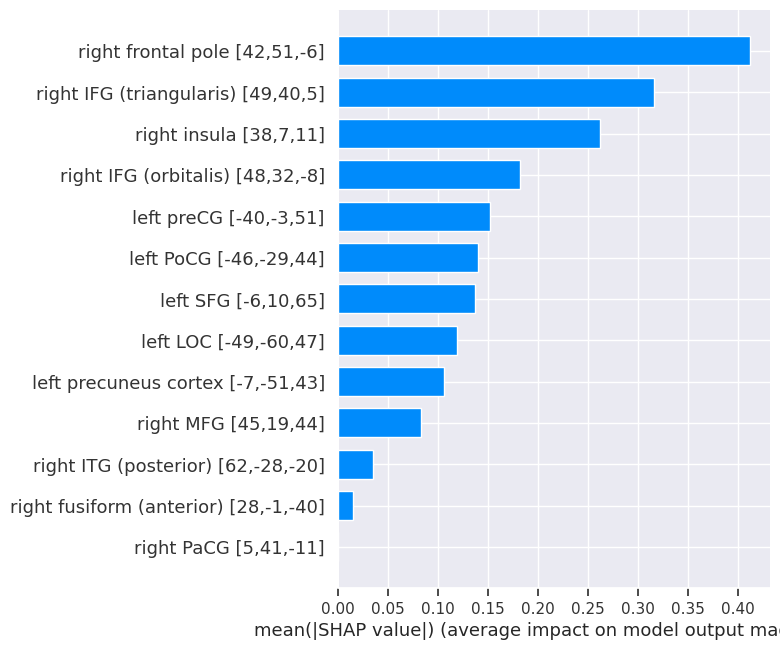

In [ ]:
shap.summary_plot(shap_values_reduced_2_3, features=X_100_reduced_2_3, feature_names=tuned_xgb_reduced_gridsearch_2_3.get_booster().feature_names, max_display = 16, plot_type = 'bar',class_names={0: 'Sp E Vis E', 1: 'Sp E Vis H', 2: 'Sp H Vis E', 3: 'Sp H Vis H'}, class_inds='original')

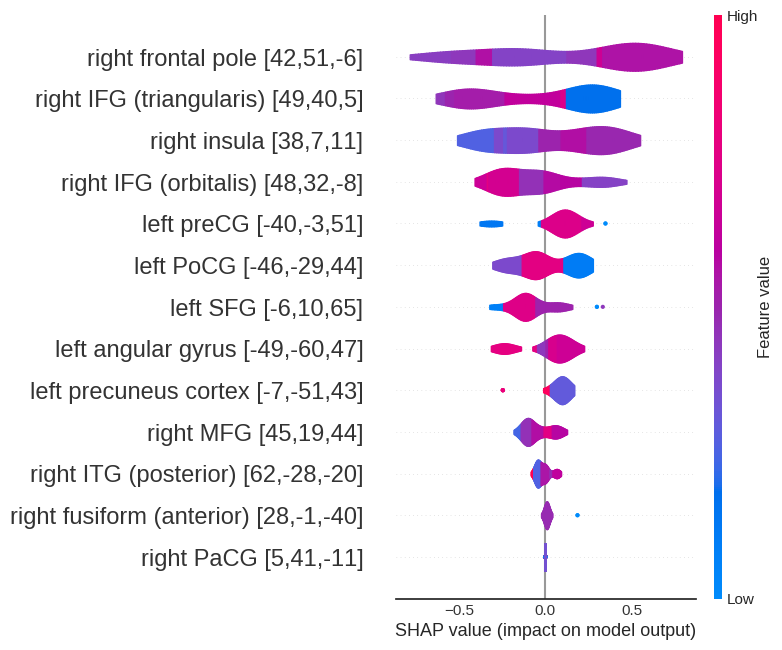

In [ ]:
plt.figure(figsize=None)
shap.summary_plot(shap_values_reduced_2_3, X_100_reduced_2_3, feature_names=tuned_xgb_reduced_gridsearch_2_3.get_booster().feature_names,plot_type = 'violin',show=False)
plt.yticks(fontsize=17)
plt.tight_layout()
plt.savefig("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/figures/class_2_3_13feat_nameupdated.svg", format="svg")
plt.show()

### Class 0 vs Class 2

#### feature names

In [ ]:
tuned_xgb_reduced_gridsearch_0_2.get_booster().feature_names = feat_name_reduced

####  shap values

In [ ]:
shap.initjs()

explainer_reduced_0_2 = shap.TreeExplainer(tuned_xgb_reduced_gridsearch_0_2)
shap_values_reduced_0_2 = explainer_reduced_0_2.shap_values(X_100_reduced_0_2)
shap_values_reduced_0_2

array([[ 0.02342327,  0.04312997,  0.03718977,  0.0037192 ,  0.        ,
         0.09129232, -0.1257173 ,  0.01398846, -0.02704927, -0.0585881 ,
        -0.03206049, -0.00519899,  0.06532303],
       [ 0.08230118, -0.01076889, -0.06944916,  0.0037192 ,  0.        ,
         0.09129232, -0.00430353, -0.0570812 , -0.02704927,  0.02279614,
         0.0165154 , -0.00519899,  0.06532303],
       [-0.086932  , -0.01076889, -0.00966598,  0.0037192 ,  0.        ,
        -0.1267754 , -0.00430353, -0.01145037, -0.02704927,  0.02279614,
         0.0165154 ,  0.03943467, -0.02897624],
       [-0.086932  , -0.01076889, -0.00966598,  0.0037192 ,  0.        ,
        -0.1267754 , -0.00430353, -0.01145037, -0.02704927,  0.02279614,
        -0.01687056, -0.04136361, -0.02897624],
       [ 0.08230118, -0.01076889, -0.00966598,  0.0037192 ,  0.        ,
         0.09129232, -0.00430353, -0.01145037, -0.02704927,  0.02279614,
         0.0165154 , -0.04136361, -0.02897624],
       [ 0.08230118, -0.010768

####  Plots

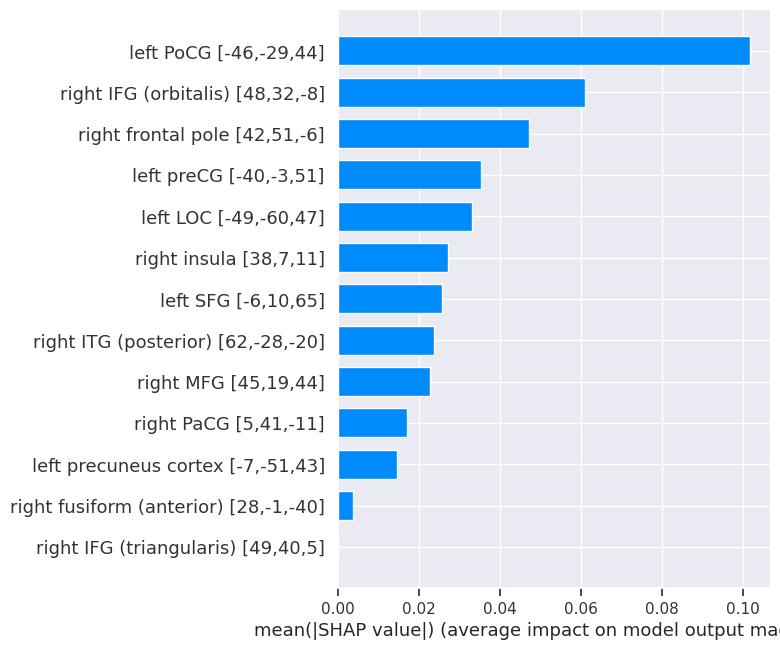

In [ ]:
shap.summary_plot(shap_values_reduced_0_2, features=X_100_reduced_0_2, feature_names=tuned_xgb_reduced_gridsearch_0_2.get_booster().feature_names, max_display = 16, plot_type = 'bar',class_names={0: 'Sp E Vis E', 1: 'Sp E Vis H', 2: 'Sp H Vis E', 3: 'Sp H Vis H'}, class_inds='original')

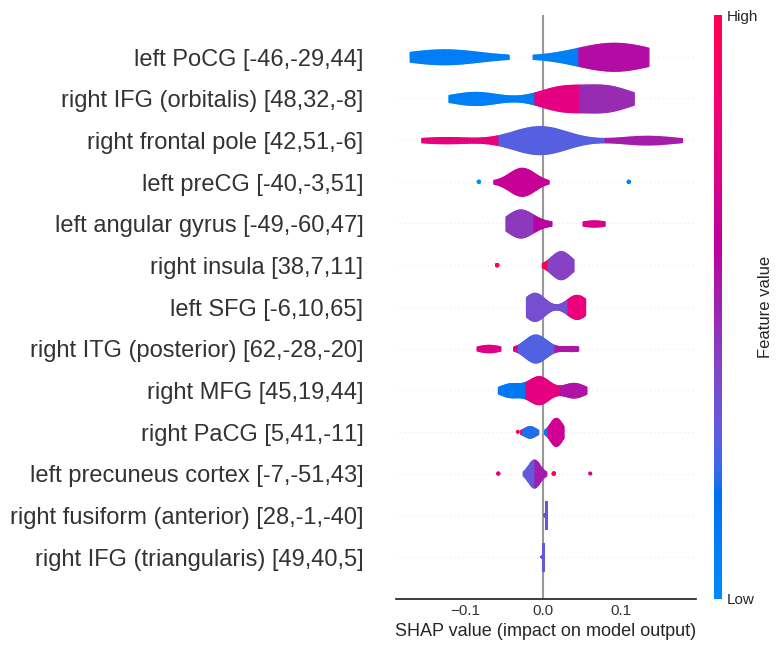

In [ ]:
plt.figure(figsize=None)
shap.summary_plot(shap_values_reduced_0_2, X_100_reduced_0_2, feature_names=tuned_xgb_reduced_gridsearch_0_2.get_booster().feature_names,plot_type = 'violin',show=False)
plt.yticks(fontsize=17)
plt.tight_layout()
plt.savefig("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/figures/class_0_2_13feat_nameupdated.svg", format="svg")
plt.show()

### Class 1 vs Class 3

#### feature names

In [ ]:
tuned_xgb_reduced_gridsearch_1_3.get_booster().feature_names = feat_name_reduced

####  shap values

In [ ]:
shap.initjs()

explainer_reduced_1_3 = shap.TreeExplainer(tuned_xgb_reduced_gridsearch_1_3)
shap_values_reduced_1_3 = explainer_reduced_1_3.shap_values(X_100_reduced_1_3)
shap_values_reduced_1_3

array([[ 0.        , -0.12922016,  0.02203574,  0.08457846,  0.04651803,
         0.06272219, -0.09789771,  0.2208556 , -0.12147338, -0.5071907 ,
         0.        ,  0.07167454, -0.12109197],
       [ 0.        , -0.11121016,  0.01021773,  0.08457846, -0.27001828,
         0.195387  ,  0.00231141,  0.1795926 , -0.12147338,  0.3957206 ,
         0.        , -0.14849104,  0.07148388],
       [ 0.        ,  0.49717024,  0.02203574,  0.01352654,  0.04651803,
        -0.0087434 , -0.09789771,  0.2208556 , -0.12147338, -0.4051491 ,
         0.        ,  0.07167454, -0.28578582],
       [ 0.        ,  0.16995022,  0.01021773,  0.05553085,  0.04651803,
         0.22830532, -0.09789771,  0.2208556 , -0.12147338, -0.5071907 ,
         0.        ,  0.07167454, -0.12109197],
       [ 0.        , -0.11121016,  0.01021773,  0.08457846,  0.04651803,
         0.195387  , -0.04233135,  0.2208556 , -0.12147338,  0.35474747,
         0.        ,  0.07167454, -0.34871385],
       [ 0.        , -0.129220

####  Plots

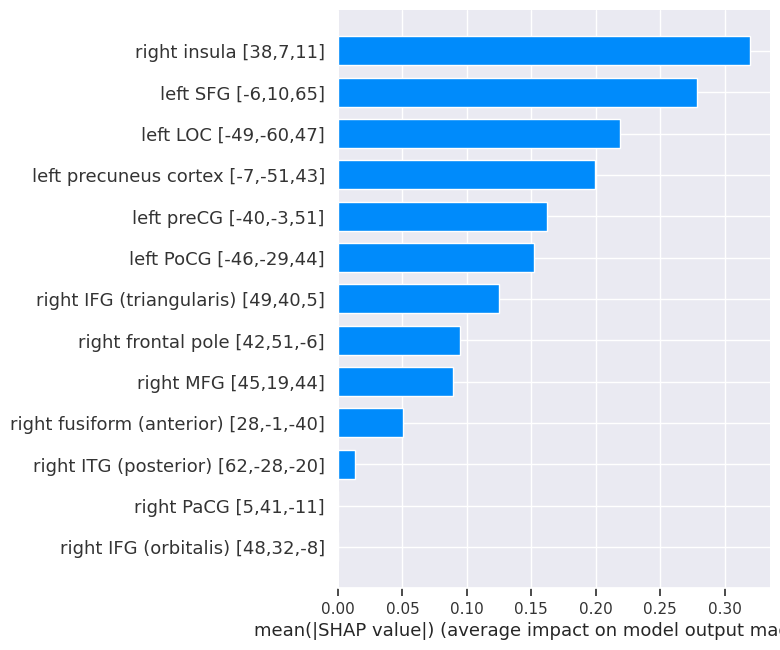

In [ ]:
shap.summary_plot(shap_values_reduced_1_3, features=X_100_reduced_1_3, feature_names=tuned_xgb_reduced_gridsearch_1_3.get_booster().feature_names, max_display = 16, plot_type = 'bar',class_names={0: 'Sp E Vis E', 1: 'Sp E Vis H', 2: 'Sp H Vis E', 3: 'Sp H Vis H'}, class_inds='original')

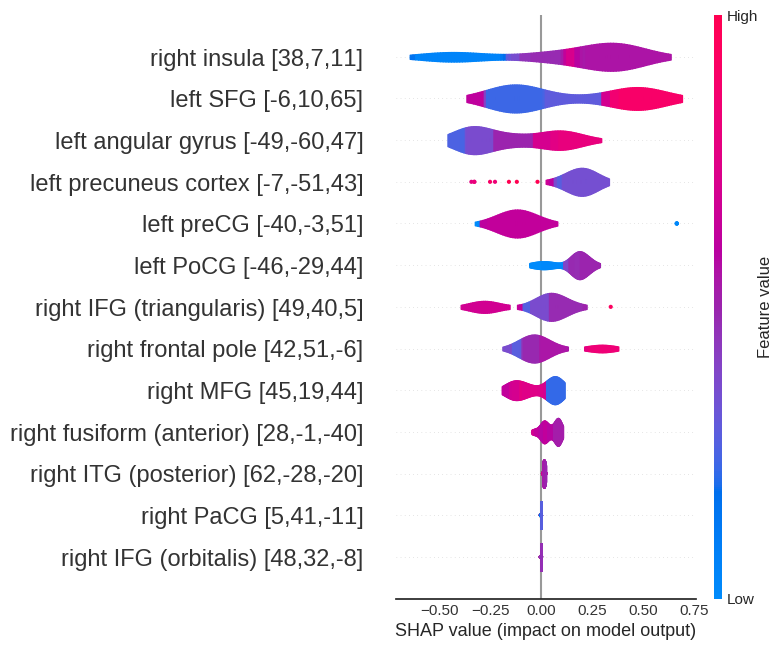

In [ ]:
plt.figure(figsize=None)
shap.summary_plot(shap_values_reduced_1_3, X_100_reduced_1_3, feature_names=tuned_xgb_reduced_gridsearch_1_3.get_booster().feature_names,plot_type = 'violin',show=False)
plt.yticks(fontsize=17)
plt.tight_layout()
plt.savefig("/content/drive/My Drive/Colab Notebooks/data-brain-xgboost-dividedattn-wangetal/figures/class_1_3_13feat_nameupdated.svg", format="svg")
plt.show()

### All subplots in one palatte

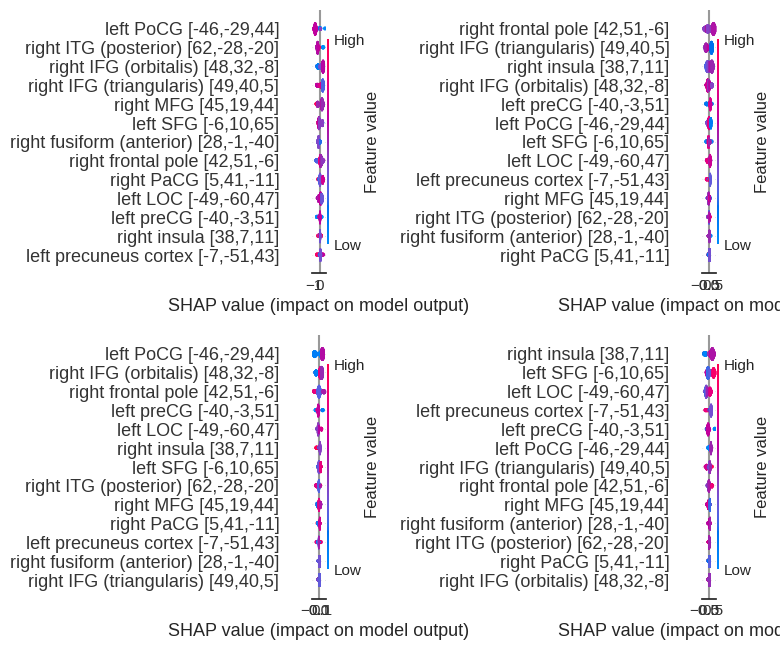

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(2,2,1)
shap.summary_plot(shap_values_reduced_0_1, X_100_reduced_0_1, feature_names=tuned_xgb_reduced_gridsearch_0_1.get_booster().feature_names,plot_type = 'violin', show=False)
plt.subplot(2,2,2)
shap.summary_plot(shap_values_reduced_2_3, X_100_reduced_2_3, feature_names=tuned_xgb_reduced_gridsearch_2_3.get_booster().feature_names,plot_type = 'violin', show=False)
plt.subplot(2,2,3)
shap.summary_plot(shap_values_reduced_0_2, X_100_reduced_0_2, feature_names=tuned_xgb_reduced_gridsearch_0_2.get_booster().feature_names,plot_type = 'violin', show=False)
plt.subplot(2,2,4)
shap.summary_plot(shap_values_reduced_1_3, X_100_reduced_1_3, feature_names=tuned_xgb_reduced_gridsearch_1_3.get_booster().feature_names,plot_type = 'violin', show=False)
#plt.tight_layout()
plt.show()